## Starfysh tutorial

#### Azizi Lab

Siyu He, Yinuo Jin

06-12-2022

In [1]:
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip3 install scanpy
    #!pip3 install histomicstk
    from google.colab import drive
    drive.mount('/content/drive')
    import sys
    sys.path.append('/content/drive/MyDrive/SpatialModelProject/model_test_colab/')

In [2]:
import pandas as pd
import scanpy as sc
import numpy as np
import torch
import os
import matplotlib.pyplot as plt
import torch.optim as optim
from torch.utils.data import DataLoader
from matplotlib.pyplot import rc_context

## load starfysh

In [3]:
from starfysh_img import (utils,
                      plot_utils,
                      starfysh,
                      dataloader,
                      post_analysis
                      )

## load data and gene signature

In [4]:
# set the data folder
if IN_COLAB:
    data_folder = '/content/drive/MyDrive/SpatialModelProject/data'
else:
    data_folder = 'data/'
    #data_folder = 'simu_data'
    

In [5]:
## load data and gene signature
sample_id='MBC_4A' # , CID444971, CID4465, CID4290, CID4535, 1142243F, 1160920F
#sample_id='simu_5'
sig_file_name = 'bc_signatures_version_0201.csv'
#sig_file_name = 'marker.csv'
#sig_file_name = 'tnbc_signature.csv'
adata_sample, adata_sample_normed = utils.load_adata(data_folder,sample_id,n_genes=2000)
gene_sig = pd.read_csv(os.path.join(data_folder,sig_file_name))

## filter the low expressed genes
gene_sig = utils.filter_gene_sig(gene_sig,adata_sample.to_df())

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing1: delete the mt and rp
Preprocessing2: Normalize


/usr/local/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Preprocessing3: Logarithm
Preprocessing4: Find the variable genes


In [6]:
if data_folder =='simu_data':
        member = pd.read_csv(os.path.join(data_folder,sample_id,'members.st_synth.csv'),index_col=0)
        proportions = pd.read_csv(os.path.join(data_folder,sample_id,'proportions.st_synth.csv'),index_col=0)
        gene_sig = gene_sig.iloc[:,[1,3,4,7,8]]
        gene_sig.columns=['CAFs','Normal Epithelial','Myeloid','T-cells','Cancer Epithelial']
        gene_sig = gene_sig.reindex(columns=['CAFs','Cancer Epithelial','Myeloid','Normal Epithelial','T-cells'])

## get library size & image

In [7]:
if data_folder =='simu_data':
    umap_df = utils.get_umap(adata_sample)
    map_info = utils.get_simu_map_info(umap_df)
else:
    #adata_image, adata_image_h, adata_image_e,map_info = utils.preprocess_img(data_folder,sample_id,adata_sample.obs.index,hchannal=False)
    adata_image,map_info = utils.preprocess_img(data_folder,sample_id,adata_sample.obs.index,hchannal=False)

log_lib = np.log((adata_sample.to_df()).sum(axis=1))
win_loglib = utils.get_windowed_library(adata_sample,
                                  map_info,
                                  log_lib,
                                  window_size=3
                                 )

/Users/siyuhe/03_Spatial_project/starfysh_img/utils.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_info.loc[:,'imagerow'] = tissue_position_list.iloc[:,3] *tissue_hires_scalef
/Users/siyuhe/03_Spatial_project/starfysh_img/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_info.loc[:,'imagecol'] = tissue_position_list.iloc[:,4] *tissue_hires_scalef


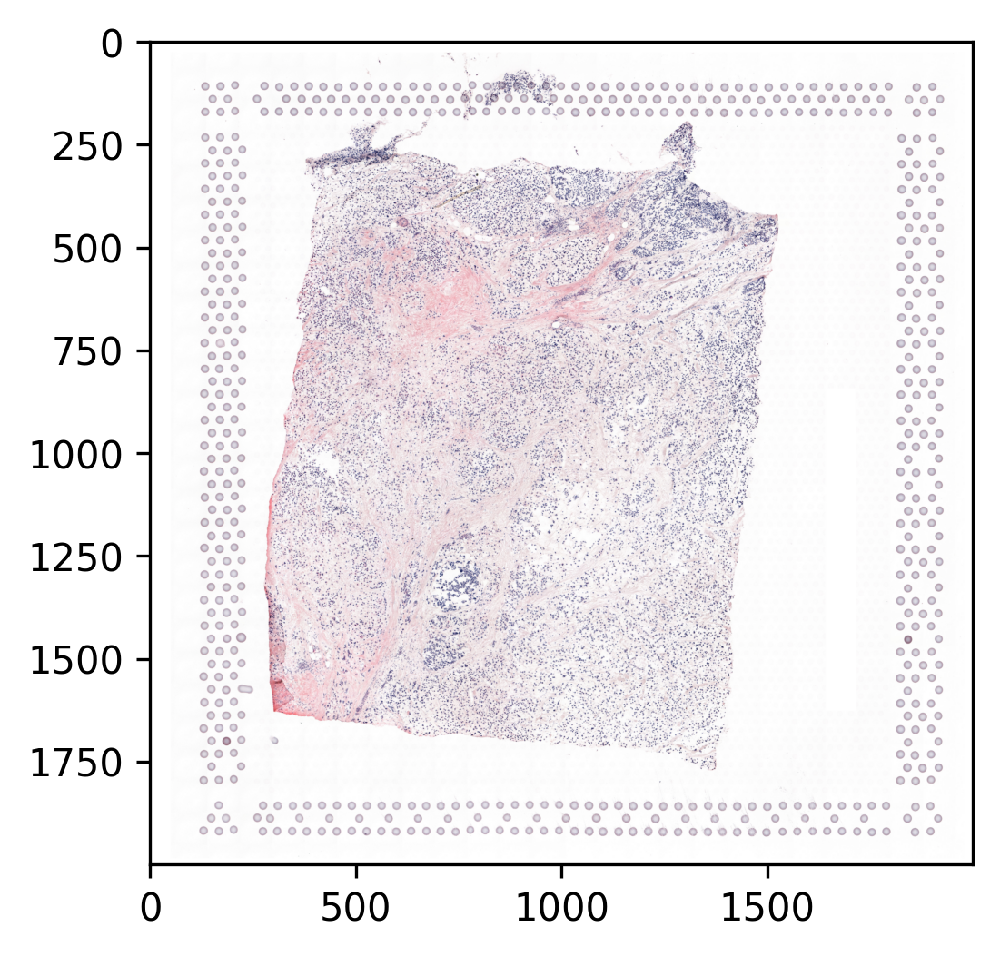

In [42]:
plt.figure(dpi=300)
plt.imshow(adata_image)

## plot log lib

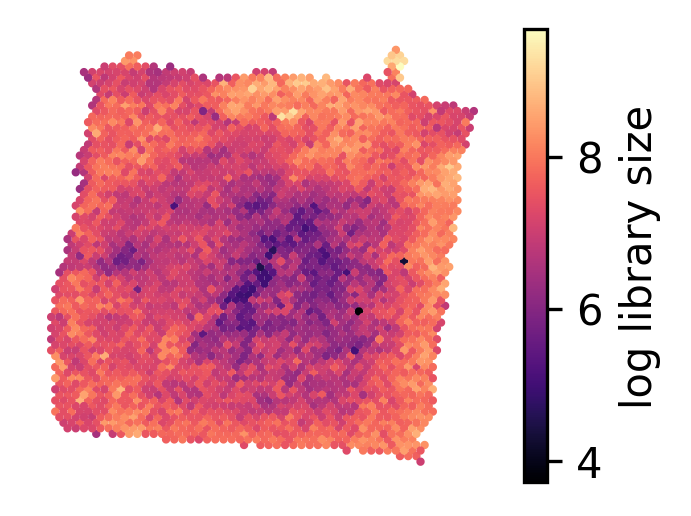

In [9]:
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 log_lib,
                 label='log library size'
                )

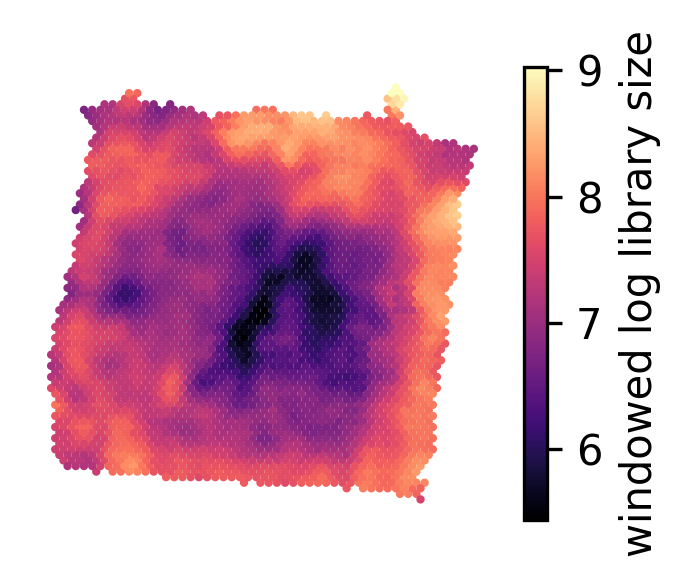

In [10]:
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 win_loglib,
                 label='windowed log library size'
                )

## plot raw gene expression

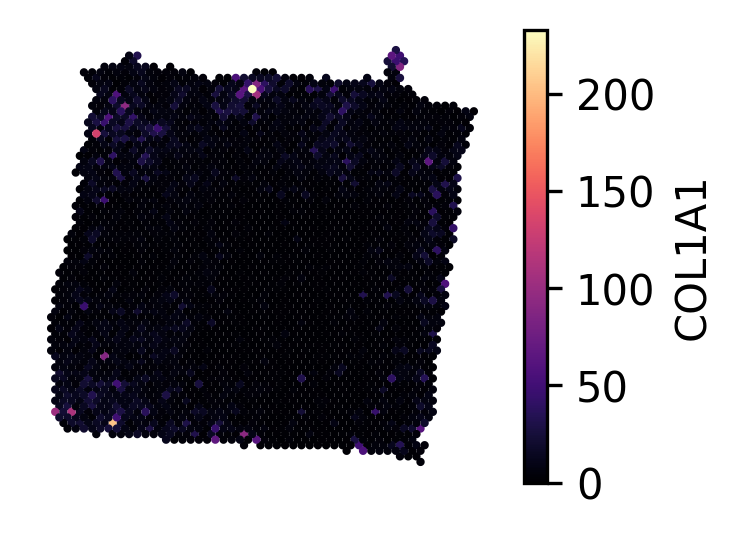

In [11]:
plot_gene_name = 'COL1A1'
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 adata_sample.to_df().loc[:,plot_gene_name],
                 label=plot_gene_name
                )

## prepare input (prior, anchor spots and data)

In [12]:
# make sure the signature gene name is matched with expression matrix
adata_sample = utils.get_adata_wsig(adata_sample, gene_sig)
adata_sample_normed = utils.get_adata_wsig(adata_sample_normed, gene_sig)

# make sure the signature gene name is matched with expression matrix
#sig_mean = utils.get_sig_mean(adata_sample, gene_sig, log_lib)
sig_mean = utils.get_sig_mean(adata_sample, gene_sig, log_lib)
#sig_mean = sig_mean.fillna(0)

the number of original variable genes in the dataset (2000,)
the number of siganture genes in the dataset (541,)
after filter out some genes in the signature not in the var_names ... (505,)
after filter out some genes not highly expressed in the signature ... (505,)
combine the varibale and siganture, the total unique gene number is ... 2427
the number of original variable genes in the dataset (2000,)
the number of siganture genes in the dataset (541,)
after filter out some genes in the signature not in the var_names ... (505,)
after filter out some genes not highly expressed in the signature ... (505,)
combine the varibale and siganture, the total unique gene number is ... 2427


In [13]:
from scipy.stats import zscore
sig_mean = sig_mean+1e-12
sig_mean_zscore = sig_mean.apply(zscore,axis=0)
sig_mean_zscore[sig_mean_zscore<0]=0 
#sig_mean_zscore = sig_mean_zscore-sig_mean_zscore.min()
sig_mean_zscore = sig_mean_zscore.fillna(0)

In [14]:
pure_spots, pure_dict, pure_idx = utils.get_anchor_spots(adata_sample,
                                               sig_mean_zscore,#sig_mean_zscore,
                                               v_low = 10,#10,#10, 
                                               v_high = 95,#95,#99,
                                               n_anchor = 60#60#60
                                              )

/Users/siyuhe/03_Spatial_project/starfysh_img/utils.py:244: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  pure_spots = np.transpose(sig_mean.loc[highq_spots,:].index[(-np.array(sig_mean.loc[highq_spots,:])).argsort(axis=0)[:n_anchor,:]])


## plot anchor spots

/usr/local/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'sample' as categorical
/usr/local/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'feature_types' as categorical
/usr/local/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new C

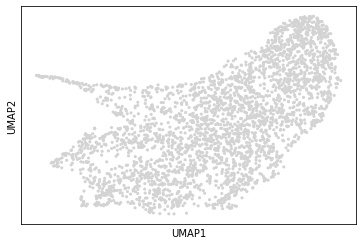

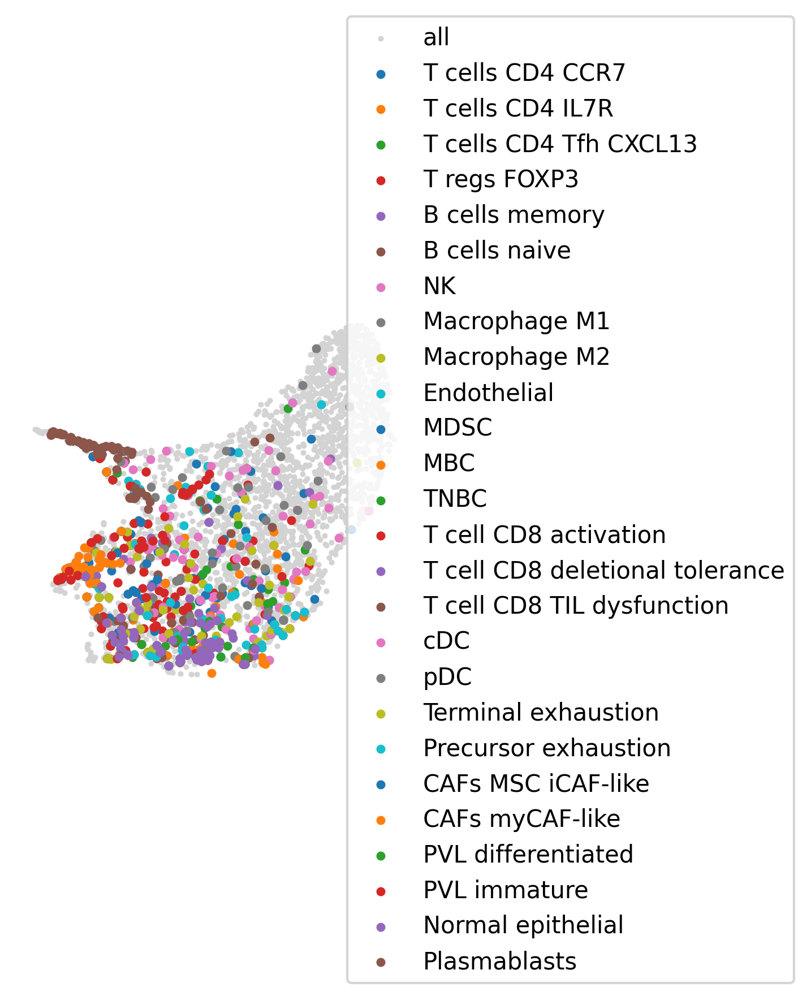

In [15]:
umap_df = utils.get_umap(adata_sample)
plot_utils.plot_anchor_spots(umap_df,pure_spots,sig_mean,bbox_x=2)

## Run starfysh

In [24]:
import torch.nn as nn
from torch.distributions import Normal, LogNormal,Dirichlet, kl_divergence as kl
import torch

class AVAE_poe(nn.Module):
    """ simple model design ***
    p(x|z)=f(z)
    p(z|x)~N(0,1)
    q(z|x)~g(x)
    """
    
    def __init__(self,
                 adata,
                 gene_sig,
                 patch_r,
                 win_loglib,
    ) -> None:
        """
                 
        """
        super(AVAE_poe, self).__init__()
        
        self.win_loglib=torch.Tensor(win_loglib)
        
        self.c_in = adata.shape[1] # c_in : Num. input features (# input genes)
        self.c_bn = 10 # c_bn : latent number, numbers of bottle neck
        self.c_hidden = 256
        self.patch_r = patch_r
        self.c_kn = gene_sig.shape[1]
        
        #self.alpha = torch.nn.Parameter(torch.rand(1)*1e2,requires_grad=True)
        #self.alpha = torch.nn.Parameter(torch.rand(1)*1e2+alpha_min,requires_grad=True)
        self.alpha = torch.nn.Parameter(torch.rand(self.c_kn)*1e3,requires_grad=True)
        #self.alpha2 = torch.nn.Parameter(torch.rand(self.c_kn)*1e2,requires_grad=True)
        #self.alpha2 = torch.nn.Parameter(torch.rand(1)*1e3,requires_grad=True)

        self.c_enc = nn.Sequential(
                                nn.Linear(self.c_in, self.c_hidden, bias=True),
                                nn.BatchNorm1d(self.c_hidden, momentum=0.01,eps=0.001),
                                nn.ReLU()
        )
        
        self.c_enc_m = nn.Sequential(
                                nn.Linear(self.c_hidden, self.c_kn, bias=True),
                                nn.BatchNorm1d(self.c_kn, momentum=0.01,eps=0.001),
                                #nn.ReLU(),
                                nn.Softmax()
                                #nn.Softplus()
        )
        self.l_enc = nn.Sequential(
                                nn.Linear(self.c_in, self.c_hidden, bias=True),
                                nn.BatchNorm1d(self.c_hidden, momentum=0.01,eps=0.001),
                                nn.ReLU(),
                                #nn.Linear(self.c_hidden, 1, bias=True),
                                #nn.ReLU(),
        )
        
        self.l_enc_m = nn.Linear(self.c_hidden, 1)
        self.l_enc_logv = nn.Linear(self.c_hidden, 1)
        
        # neural network f1 to get the z, p(z|x), f1(x,\phi_1)=[z_m,torch.exp(z_logv)]
        
        self.z_enc = nn.Sequential(
                                #nn.Linear(self.c_in+self.c_kn, self.c_hidden, bias=True),
                                nn.Linear(self.c_in, self.c_hidden, bias=True),
                                nn.BatchNorm1d(self.c_hidden, momentum=0.01,eps=0.001),
                                nn.ReLU(),
        )
        self.z_enc_m = nn.Linear(self.c_hidden, self.c_bn *  self.c_kn)
        self.z_enc_logv = nn.Linear(self.c_hidden, self.c_bn * self.c_kn)
        
        # gene dispersion
        self.px_r = torch.nn.Parameter(torch.randn(self.c_in),requires_grad=True)
        #self.alpha= torch.nn.Parameter(torch.rand(1)*1e3,requires_grad=True)

        # neural network g to get the x_m and x_v, p(x|z), g(z,\phi_3)=[x_m,x_v]
        self.px_hidden_decoder = nn.Sequential(
                                nn.Linear(self.c_bn, self.c_hidden, bias=True),
                                nn.ReLU(),         
        )
        self.px_scale_decoder = nn.Sequential(
                              nn.Linear(self.c_hidden,self.c_in),
                              nn.Softplus(),
                              #nn.Softmax(dim=-1),
                              #nn.Softmax(),
        )
        
        self.px_r_poe = torch.nn.Parameter(torch.randn(self.c_in),requires_grad=True)
        

        self.img_l_enc = nn.Sequential(
                                nn.Linear(self.patch_r*self.patch_r*4*3, self.c_hidden, bias=True),
                                nn.BatchNorm1d(self.c_hidden, momentum=0.01,eps=0.001),
                                nn.ReLU(),
        )
        self.img_l_enc_m = nn.Linear(self.c_hidden, 1)
        self.img_l_enc_logv = nn.Linear(self.c_hidden, 1)
        
        self.img_c_enc = nn.Sequential(
                          nn.Linear(self.patch_r*self.patch_r*4*3, self.c_hidden, bias=True), # flatten the images into 1D
                          nn.BatchNorm1d(self.c_hidden, momentum=0.01,eps=0.001),
                          nn.ReLU()
                          )  
        self.img_c_enc_m = nn.Sequential(
                                nn.Linear(self.c_hidden, self.c_kn, bias=True),
                                nn.BatchNorm1d(self.c_kn, momentum=0.01,eps=0.001),
                                nn.Softmax()
        )

        self.imgVAE_z_enc = nn.Sequential(
                                nn.Linear(self.patch_r*self.patch_r*4*3, self.c_hidden, bias=True),
                                nn.BatchNorm1d(self.c_hidden, momentum=0.01,eps=0.001),
                                nn.ReLU(),
        )
        

        self.imgVAE_mu = nn.Linear(self.c_hidden, self.c_bn *  self.c_kn)
        self.imgVAE_logvar = nn.Linear(self.c_hidden, self.c_bn * self.c_kn)
        

        self.imgVAE_z_fc = nn.Linear(self.c_bn, self.c_hidden)
        
        self.imgVAE_dec = nn.Sequential(nn.Linear(self.c_hidden, self.patch_r*self.patch_r*4*3, bias=True),
                                  nn.BatchNorm1d(self.patch_r*self.patch_r*4*3, momentum=0.01, eps=0.001),                              
                                  )
        
       
        # PoE
        self.POE_z_fc = nn.Linear(self.c_bn, self.c_hidden)
    

        # neural network g to get the x_m and x_v, p(x|z), g(z,\phi_3)=[x_m,x_v]
        self.POE_z_fc = nn.Sequential(
                                nn.Linear(self.c_bn, self.c_hidden, bias=True),
                                nn.ReLU(),         
        )
        
        self.POE_px_scale_decoder = nn.Sequential(
                              nn.Linear(self.c_hidden,self.c_in),
                              #nn.ReLU(),
                              #nn.Softmax(),
                              nn.Softplus()
        )
        
        
        self.POE_dec_img = nn.Sequential(      
                                  nn.Linear(self.c_hidden, self.patch_r*self.patch_r*4*3, bias=True),
                                  nn.BatchNorm1d(self.patch_r*self.patch_r*4*3, momentum=0.01, eps=0.001),
                                  #nn.ReLU(),           
                                  )
        
        
         
    def reparameterize(self, mu, log_var):
        """
        :param mu: mean from the encoder's latent space
        :param log_var: log variance from the encoder's latent space
        """
        std = torch.exp(0.5*log_var) # standard deviation
        eps = torch.randn_like(std) # `randn_like` as we need the same size
        sample = mu + (eps * std) # sampling
        return sample
    
    def inference(self,
                  x,
                 ):
        #library = torch.log(x.sum(1)).unsqueeze(1)
        # l is inferred from logrithmized x
        x1=torch.log(1+x)
        hidden = self.l_enc(x1)
        ql_m = self.l_enc_m(hidden)
        ql_logv = self.l_enc_logv(hidden)
        ql = self.reparameterize(ql_m, ql_logv)
        ql = torch.clamp(ql, min = 0.1)

        x_n = torch.log(1+x)
        hidden = self.c_enc(x_n)
        qc_m =  self.c_enc_m(hidden) 

        qc = Dirichlet(self.alpha * qc_m).rsample()[:,:,None]
        
        hidden = self.z_enc(x_n)
        qz_m_ct = self.z_enc_m(hidden).reshape([x1.shape[0],self.c_kn,self.c_bn])
        qz_m_ct = (qc * qz_m_ct)
        
        qz_m = qz_m_ct.sum(axis=1)
        qz_logv_ct = self.z_enc_logv(hidden).reshape([x1.shape[0],self.c_kn,self.c_bn])
        qz_logv_ct = (qc * qz_logv_ct)    
        qz_logv = qz_logv_ct.sum(axis=1)
        
        qz = self.reparameterize(qz_m, qz_logv)
        return dict(
                    qc_m = qc_m,
                    qc=qc,
                    qz_m=qz_m,
                    qz_m_ct=qz_m_ct,
                    qz_logv = qz_logv,
                    qz_logv_ct = qz_logv_ct,
                    qz=qz,
                    ql_m=ql_m,
                    ql_logv = ql_logv,
                    ql=ql
                   )
    
    def predict_imgVAE(self, x):
        
        x=x*255
        hidden = self.img_l_enc(x)
        img_ql_m = self.img_l_enc_m(hidden)
        img_ql_logv = self.img_l_enc_logv(hidden)
        img_ql = self.reparameterize(img_ql_m, img_ql_logv)
        img_ql = torch.clamp(img_ql, min = 0.1)
        
        hidden = self.img_c_enc(x)
        img_qc_m =  self.img_c_enc_m(hidden) 
        img_qc = Dirichlet(self.alpha * img_qc_m).rsample()[:,:,None]
        
        hidden = self.imgVAE_z_enc(x)
        img_qz_m_ct = self.imgVAE_mu(hidden).reshape([x.shape[0],self.c_kn,self.c_bn])
        img_qz_m_ct = (img_qc * img_qz_m_ct)
        img_qz_m = img_qz_m_ct.sum(axis=1)
        
        img_qz_logv_ct = self.imgVAE_logvar(hidden).reshape([x.shape[0],self.c_kn,self.c_bn])
        img_qz_logv_ct = (img_qc * img_qz_logv_ct)
        img_qz_logv = img_qz_logv_ct.sum(axis=1)
        
        img_qz = self.reparameterize(img_qz_m, img_qz_logv)

        hidden = self.imgVAE_z_fc(img_qz) 
        reconstruction = self.imgVAE_dec(hidden)

        return dict(reconstruction  = reconstruction, 
                    img_z_mu = img_qz_m, 
                    img_z_logv = img_qz_logv,
                    img_qc = img_qc,
                    img_qc_m = img_qc_m,
                    img_ql_m = img_ql_m,
                    img_ql_logv =img_ql_logv,
                    img_ql = img_ql
                   )
    
    
    def generative(self,
                   inference_outputs,
                   x,
                   xs_k,
                   library_i,
                   img_path_outputs
                  ):
        
        qz = inference_outputs['qz']
        ql = inference_outputs['ql']
        ql_m = inference_outputs['ql_m']
        img_ql = img_path_outputs['img_ql']
        
        hidden = self.px_hidden_decoder(qz)
        px_scale = self.px_scale_decoder(hidden)
        px_rate = torch.exp((ql+img_ql)/2) * px_scale 

        xs_k = xs_k / torch.exp(ql) * torch.exp(ql.mean(axis=1,keepdims=True))
        
        pc_p = self.alpha * xs_k + 1e-5

        return dict(
                    px_rate=px_rate,
                    px_r=self.px_r,
                    pc_p=pc_p,
                    xs_k=xs_k,
                   )
        
    def predictor_POE(self, 
                      inference_outputs,
                      exp_path_outputs, 
                      img_path_outputs,
                     ):
        
        
        mu_img = img_path_outputs['img_z_mu']
        logvar_img = img_path_outputs['img_z_logv']
        
        
        mu_exp = inference_outputs['qz_m']
        logvar_exp = inference_outputs['qz_logv']
        ql = inference_outputs['ql']
        
        batch, _ = mu_exp.shape
        
        var_poe = torch.div(1., 
                            1 + 
                            torch.div(1., torch.exp(logvar_exp)) + 
                            torch.div(1., torch.exp(logvar_img))
                            )
        
        mu_poe = var_poe * (0 + 
                            mu_exp * torch.div(1., torch.exp(logvar_exp)+1e-5) + 
                            mu_img * torch.div(1., torch.exp(logvar_img)+1e-5)                           
                            )
        
        z = self.reparameterize(mu_poe, torch.log(var_poe+0.001))
        
        hidden = self.POE_z_fc(z)
        
        px_scale_rna =  self.POE_px_scale_decoder(hidden)
        
        px_rate_poe = torch.exp(ql) * px_scale_rna 
        px_r_poe = self.px_r_poe
        #reconstruction_rna_peri =  self.POE_dec_rna(torch.cat((x_peri,x_peri_sig),1))
        
        reconstruction_img =  self.POE_dec_img(hidden)
        
        
        return dict(px_rate_poe = px_rate_poe ,
                    px_r_poe = px_r_poe,
                    reconstruction_img = reconstruction_img, 
                    mu_poe = mu_poe,
                    var_poe = torch.log(var_poe+0.001)
                   )
    
    
    def get_loss(self,
            generative_outputs,
            inference_outputs,
            img_path_outputs,
            poe_path_outputs,   
            x, 
            x_peri,
            library,
            adata_img
        ):  
        
        beta = 0.001
        alpha_c = 5
        
        qc_m = inference_outputs["qc_m"]
        qc = inference_outputs["qc"]
        
        qz_m = inference_outputs["qz_m"]
        qz_logv = inference_outputs["qz_logv"]
        qz = inference_outputs["qz"]
        
        ql_m = inference_outputs["ql_m"]
        ql_logv = inference_outputs['ql_logv']
        ql = inference_outputs['ql']
        
        px_rate = generative_outputs["px_rate"]
        px_r = generative_outputs["px_r"]
        pc_p = generative_outputs["pc_p"]
        
        px_rate_poe = poe_path_outputs['px_rate_poe']
        px_r_poe = poe_path_outputs['px_r_poe']
        recon_poe_img = poe_path_outputs['reconstruction_img']
        logvar_poe = poe_path_outputs['var_poe']
        mu_poe = poe_path_outputs['mu_poe']
        
        criterion = nn.MSELoss(reduction='sum')
        reconst_loss_poe_rna = -NegBinom(px_rate_poe, torch.exp(px_r_poe)).log_prob(x).sum(-1).mean()
        
        bce_loss_poe_img = criterion(recon_poe_img,adata_img)
        
        
        Loss_IBJ = (torch.sum(reconst_loss_poe_rna) + bce_loss_poe_img) + \
                    beta * (-0.5 * torch.sum(1+logvar_poe-mu_poe.pow(2)-logvar_poe.exp()))
        
        
        mean = torch.zeros_like(qz_m)
        scale = torch.ones_like(qz_logv)
        
        kl_divergence_z = kl(Normal(qz_m, torch.sqrt(torch.exp(qz_logv))), Normal(mean, scale)).sum(
            dim=1
        ).mean()
     
        kl_divergence_n = kl(Normal(ql_m, torch.sqrt(torch.exp(ql_logv))), Normal(library,torch.ones_like(ql))).sum(
            dim=1
        ).mean()
        
        
        if (x_peri[:,0]==1).sum()>0:

            kl_divergence_c = kl(Dirichlet(qc_m[x_peri[:,0]==1]*self.alpha), Dirichlet(pc_p[x_peri[:,0]==1])).mean()
            if (x_peri[:,0]==0).sum()>0:
                if ((x_peri[:,0]==0)&(library[:,0]<torch.quantile(self.win_loglib, 0.2))).sum()>0:
                    kl_divergence_c = kl_divergence_c +  1e-1*kl(Dirichlet(qc_m[(x_peri[:,0]==0)&(library[:,0]<torch.quantile(self.win_loglib, 0.2))]*self.alpha), Dirichlet(pc_p[(x_peri[:,0]==0)&(library[:,0]<torch.quantile(self.win_loglib, 0.2))])).mean()
                if ((x_peri[:,0]==0)&(library[:,0]>=torch.quantile(self.win_loglib, 0.2))).sum()>0:
                    kl_divergence_c = kl_divergence_c +  1e-2*kl(Dirichlet(qc_m[(x_peri[:,0]==0)&(library[:,0]>=torch.quantile(self.win_loglib, 0.2))]*self.alpha), Dirichlet(pc_p[(x_peri[:,0]==0)&(library[:,0]>=torch.quantile(self.win_loglib, 0.2))])).mean()
        else:
            kl_divergence_c = torch.Tensor([0.0])

        
        reconst_loss = -NegBinom(px_rate, torch.exp(px_r)).log_prob(x).sum(-1).mean()
        
        loss_exp = reconst_loss + kl_divergence_z+ kl_divergence_c + kl_divergence_n
        
        
        mu_img = img_path_outputs['img_z_mu']
        logvar_img = img_path_outputs['img_z_logv']
        recon_img = img_path_outputs['reconstruction']
        img_qc = img_path_outputs['img_qc']
        img_ql = img_path_outputs['img_ql']
        img_ql_m = img_path_outputs['img_ql_m']
        img_ql_logv = img_path_outputs['img_ql_logv']
        img_qc_m = img_path_outputs['img_qc_m']
        
        #print(img_qc.shape)
        #print(qc_m.shape)
        
        kl_divergence_n_img = kl(Normal(img_ql_m, torch.sqrt(torch.exp(img_ql_logv))), Normal(library,torch.ones_like(ql))).sum(
            dim=1
        ).mean()
        
        kl_divergence_z_img = kl(Normal(mu_img, torch.sqrt(torch.exp(logvar_img))), Normal(mean, scale)).sum(
            dim=1
        )
        
        if (x_peri[:,0]==1).sum()>0:
            kl_divergence_c_img = kl(Dirichlet(img_qc_m[x_peri[:,0]==1]*self.alpha), Dirichlet(pc_p[x_peri[:,0]==1])).mean()
        else:
            kl_divergence_c_img = torch.Tensor([0.0])
        
        bce_loss_img = criterion(recon_img, adata_img)
        loss_img = torch.sum(bce_loss_img + kl_divergence_z_img+ kl_divergence_n_img+kl_divergence_c_img)
        
        Loss_IBM = (loss_exp+loss_img)
        loss = Loss_IBJ + alpha_c * Loss_IBM 
        
        
        return (loss,
                reconst_loss,
                kl_divergence_z,
                kl_divergence_c,
                kl_divergence_n
               )

    
def valid_model(model):
    
    model.eval()

    x_valid = torch.Tensor(np.array(adata_sample_filter.to_df()))
    x_valid = x_valid.to(device)
    gene_sig_exp_valid = torch.Tensor(np.array(gene_sig_exp_m)).to(device)
    library = torch.log(x_valid.sum(1)).unsqueeze(1)

    inference_outputs =  model.inference(x_valid)
    generative_outputs = model.generative(inference_outputs,library, gene_sig_exp_valid)

    qz_m = inference_outputs["qz_m"].detach().numpy()
    qc_m = inference_outputs["qc_m"].detach().numpy()
    qc = inference_outputs["qc"].detach().numpy()
    qz_logv = inference_outputs["qz_logv"].detach().numpy()
    qz = inference_outputs["qz"].detach().numpy()
    px_r = generative_outputs["px_r"].detach().numpy()
    pc_p = generative_outputs["pc_p"].detach().numpy()
    px_rate = generative_outputs["px_rate"].detach().numpy()
    ql = inference_outputs["ql"].detach().numpy()
    ql_m = inference_outputs["ql_m"].detach().numpy()
    px = NegBinom(generative_outputs["px_rate"], torch.exp(generative_outputs["px_r"])).sample().detach().numpy()
    

    corr_map_qcm = np.zeros([3,3])


    return 1/3*(corr_map_qcm[0,0]+corr_map_qcm[1,1]+corr_map_qcm[2,2])

from scipy.stats import pearsonr
from tqdm import tqdm
from torch.distributions import Normal, kl_divergence as kl
def train(
            model,
            dataloader,
            dataset,
            device,
            optimizer,
            
        ):
    model.train()
    
    running_loss = 0.0
    running_z = 0.0
    running_c = 0.0
    running_n = 0.0
    running_reconst = 0.0
    counter = 0
    corr_list = []
    for i, (x, 
            x_peri, 
            library_i,
            adata_img,
            data_loc,
            xs_k,
           ) in enumerate(dataloader):
        
        counter +=1
        x = x.float()
        x = x.to(device)
        
        mini_batch , _  = x.shape
        
        
        adata_img = adata_img.reshape(mini_batch,-1).float() 
        adata_img = adata_img/255
        adata_img = adata_img.to(device) 

        # gene expression, 1D data
        inference_outputs =  model.inference(x)

        # image, 2D data
        img_path_outputs = model.predict_imgVAE(adata_img)
        
        generative_outputs = model.generative(inference_outputs, x, xs_k,library_i,img_path_outputs)
        
        # POE               
        poe_path_outputs = model.predictor_POE(inference_outputs,
                                                generative_outputs, 
                                               img_path_outputs
                                            )
        
        
        (loss,
         reconst_loss,
         kl_divergence_z,
         kl_divergence_c,
         kl_divergence_n
        ) = model.get_loss(generative_outputs,
                           inference_outputs, 
                           img_path_outputs,
                           poe_path_outputs,
                           x,
                           x_peri,
                           library_i,
                           adata_img
                       )
        
        optimizer.zero_grad()
        loss.backward()
        
        running_loss += loss.item()
        running_reconst +=reconst_loss.item()
        running_z +=kl_divergence_z.item()
        running_c +=kl_divergence_c.item()
        running_n +=kl_divergence_n.item()    
        
        optimizer.step()
        
        #corr_list.append(valid_model(model))
        
        
    train_loss = running_loss / counter
    train_reconst = running_reconst / counter
    train_z = running_z / counter
    train_c = running_c / counter
    train_n = running_n / counter
    
    
    
    
    return train_loss, train_reconst, train_z, train_c, train_n, corr_list




# Reference:
# https://github.com/YosefLab/scvi-tools/blob/master/scvi/distributions/_negative_binomial.py
from torch.distributions import kl_divergence, Distribution
from torch.distributions import Gamma,Poisson
class NegBinom(Distribution):
    """
    Gamma-Poisson mixture approximation of Negative Binomial(mean, dispersion)

    lambda ~ Gamma(mu, theta)
    x ~ Poisson(lambda)
    """

    def __init__(self, mu, theta, eps=1e-5):
        """
        Parameters
        ----------
        mu : torch.Tensor
            mean of NegBinom. distribution
            shape - [# genes,]

        theta : torch.Tensor
            dispersion of NegBinom. distribution
            shape - [# genes,]
        """
        super(NegBinom, self).__init__()
        assert (mu > 0).sum() and (theta > 0).sum(), \
            "Negative mean / dispersion of Negative detected"

        self.mu = mu
        self.theta = theta
        self.eps = eps

    def sample(self):
        #print('self.theta=',self.theta)
        #print('self.mu=',self.mu)
        #assert (self.theta +self.eps> 0).sum() and (self.mu +self.eps> 0)
        lambdas = Gamma(
            concentration=self.theta,
            rate=(self.theta+self.eps) / (self.mu+self.eps),
        ).rsample()

        x = Poisson(lambdas).sample()

        return x

    def log_prob(self, x):
        """log-likelihood"""
        ll = torch.lgamma(x + self.theta) - \
             torch.lgamma(x + 1) - \
             torch.lgamma(self.theta) + \
             self.theta * (torch.log(self.theta + self.eps) - torch.log(self.theta + self.mu + self.eps)) + \
             x * (torch.log(self.mu + self.eps) - torch.log(self.theta + self.mu + self.eps))

        return ll

In [25]:
# create data loader

patch_r = 13

trainset = dataloader.shenet_traindatastack([adata_sample,
                                  adata_image],
                                 map_info,
                                 patch_r,
                                 pure_idx,
                                 win_loglib,
                                 sig_mean_zscore
                                )
trainloader = DataLoader(trainset, 
                         batch_size=32, 
                         shuffle=True)

In [26]:
alpha_min = 0
for col_idx in np.array(sig_mean.columns):
    if (1/(sig_mean.loc[pure_dict[col_idx],:]/sig_mean.loc[pure_dict[col_idx],:].sum())[col_idx]).max()>alpha_min:
        alpha_min = (1/(sig_mean.loc[pure_dict[col_idx],:]/sig_mean.loc[pure_dict[col_idx],:].sum())[col_idx]).max()


model = AVAE_poe(
            adata = adata_sample,
            gene_sig = gene_sig,
            patch_r=patch_r,
            win_loglib = win_loglib,
          )

In [27]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
lr=0.001
optimizer = optim.Adam(model.parameters(), lr=lr)

epochs= 30
train_loss = []
corr_list_all = []
for epoch in range(epochs):
    (train_epoch_loss, 
     train_reconst, 
     train_z, 
     train_c, 
     train_n, 
     corr_list) = train(model, 
                                 trainloader, 
                                 trainset, 
                                 device, 
                                 optimizer)
    train_loss.append(train_epoch_loss)
    torch.cuda.empty_cache()
    corr_list_all.append(corr_list)
    
    if (epoch+1) % 1 == 0:
            print ("Epoch[{}/{}], train_loss: {:.4f}, train_reconst: {:.4f}, train_z: {:.4f},train_c: {:.4f},train_n: {:.4f}".format(epoch+1, epochs, train_epoch_loss, train_reconst, train_z, train_c, train_n))  
print('finish lower training rate')

/usr/local/lib/python3.9/site-packages/torch/nn/modules/container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)
/usr/local/lib/python3.9/site-packages/torch/distributions/distribution.py:44: UserWarning: <class '__main__.NegBinom'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  warnings.warn(f'{self.__class__} does not define `arg_constraints`. ' +


Epoch[1/30], train_loss: 11239827.1701, train_reconst: 983.6012, train_z: 10.2021,train_c: 4980.0737,train_n: 40.8195
Epoch[2/30], train_loss: 6510565.2809, train_reconst: 669.3819, train_z: 14.6336,train_c: 2665.6026,train_n: 34.5316
Epoch[3/30], train_loss: 5138564.5361, train_reconst: 629.4640, train_z: 14.3181,train_c: 1948.4605,train_n: 29.5414
Epoch[4/30], train_loss: 4029256.9149, train_reconst: 600.7456, train_z: 14.1869,train_c: 1756.2194,train_n: 26.8178
Epoch[5/30], train_loss: 3160866.9356, train_reconst: 585.7690, train_z: 13.9597,train_c: 1773.8983,train_n: 25.2825
Epoch[6/30], train_loss: 2456915.8892, train_reconst: 576.1505, train_z: 13.3666,train_c: 1681.8893,train_n: 24.4147
Epoch[7/30], train_loss: 1905503.3222, train_reconst: 571.4008, train_z: 12.8489,train_c: 1431.1471,train_n: 23.7498
Epoch[8/30], train_loss: 1496882.0129, train_reconst: 566.6539, train_z: 12.2448,train_c: 1326.8643,train_n: 23.2459
Epoch[9/30], train_loss: 1171510.2899, train_reconst: 563.2450,

## Basic downstream analysis

In [28]:
model.eval()

recon_exp_stack = np.zeros([trainset.genexp.shape[0],trainset.genexp.shape[1]])
recon_img_stack = np.zeros([trainset.genexp.shape[0],patch_r*2,patch_r*2,3])

recon_poe_img_stack = np.zeros([trainset.genexp.shape[0],patch_r*2,patch_r*2,3])
recon_poe_rna_stack = np.zeros([trainset.genexp.shape[0],trainset.genexp.shape[1]])

wholeimg_stitch = np.ones([2000,2000,3])*(-1/255)
recon_wholeimg_stitch = np.ones([2000,2000,3])*(-1/255)
recon_poe_wholeimg_stitch = np.ones([2000,2000,3])*(-1/255)

mu_exp_stack = np.zeros([trainset.genexp.shape[0],10])
mu_img_stack = np.zeros([trainset.genexp.shape[0],10])
mu_poe_stack = np.zeros([trainset.genexp.shape[0],10])


In [29]:
for i,     (x, 
            x_peri, 
            library_i,
            adata_img,
            data_loc,
            xs_k,
           ) in enumerate(trainloader):
        #print(adata_img[2,:,:,:])
        
        mini_batch , _  = x.shape

        adata_img = adata_img.reshape(mini_batch,-1).float() 
        adata_img = adata_img/255
        adata_img = adata_img.to(device) 

        inference_outputs =  model.inference(x)
        
        
        # image, 2D data
        img_path_outputs = model.predict_imgVAE(adata_img)
        generative_outputs = model.generative(inference_outputs, x, xs_k,library_i,img_path_outputs)
        # POE               
        poe_path_outputs = model.predictor_POE(inference_outputs,
                                                generative_outputs, 
                                               img_path_outputs
                                            )

        px_r = generative_outputs["px_r"]
        px_rate = generative_outputs["px_rate"]
        recon_exp = NegBinom(generative_outputs["px_rate"], torch.exp(generative_outputs["px_r"])).sample()
        
        mu_exp = inference_outputs['qz_m']
        logvar_exp = inference_outputs['qz_logv']
        
        mu_img = img_path_outputs['img_z_mu']
        logvar_img = img_path_outputs['img_z_logv']
        recon_img = img_path_outputs['reconstruction']
        mu_img = img_path_outputs['img_z_mu']
        logvar_img = img_path_outputs['img_z_logv']
        
        
        recon_poe_rna = NegBinom(poe_path_outputs["px_rate_poe"], torch.exp(poe_path_outputs["px_r_poe"])).sample()
        
        recon_poe_img = poe_path_outputs['reconstruction_img']
        logvar_poe = poe_path_outputs['var_poe']
        mu_poe = poe_path_outputs['mu_poe']
               
        for ii in range(mini_batch):
              loc = np.where(data_loc[ii]==map_info.index)
              recon_exp_stack[loc[0][0]] = recon_exp[ii].cpu().detach().numpy()
              recon_img_stack[loc[0][0]] = recon_img.reshape([recon_img.shape[0],patch_r*2,patch_r*2,3])[ii].cpu().detach().numpy()
              recon_poe_img_stack[loc[0][0]] = recon_poe_img.reshape([recon_poe_img.shape[0],patch_r*2,patch_r*2,3])[ii].cpu().detach().numpy()
              recon_poe_rna_stack[loc[0][0]] = recon_poe_rna[ii].cpu().detach().numpy()

              mu_exp_stack[loc[0][0]] = mu_exp[ii].cpu().detach().numpy()
              mu_img_stack[loc[0][0]] = mu_img[ii].cpu().detach().numpy()
              mu_poe_stack[loc[0][0]] = mu_poe[ii].cpu().detach().numpy()

              image_col = map_info.iloc[loc[0][0]]['imagecol']
              image_row = map_info.iloc[loc[0][0]]['imagerow']

              sample_id_ii = data_loc[ii].split('-')[-1]
              image_slide_z =0
              
              #print(wholeimg_stitch[int(image_row)-patch_r:int(image_row)+patch_r,int(image_col)-patch_r:int(image_col)+patch_r,:].shape)
              #print(adata_img.reshape([mini_batch,patch_r*2,patch_r*2,3])[ii,:,:,:].cpu().detach().numpy().astype(np.uint8).shape)
              #break
              recon_wholeimg_stitch[int(image_row)-patch_r:int(image_row)+patch_r,int(image_col)-patch_r:int(image_col)+patch_r,:] = (recon_img.reshape([mini_batch,patch_r*2,patch_r*2,3])[ii,:,:,:]).cpu().detach().numpy()
              wholeimg_stitch[int(image_row)-patch_r:int(image_row)+patch_r,int(image_col)-patch_r:int(image_col)+patch_r,:] = adata_img.reshape([mini_batch,patch_r*2,patch_r*2,3])[ii,:,:,:].cpu().detach().numpy()
              recon_poe_wholeimg_stitch[int(image_row)-patch_r:int(image_row)+patch_r,int(image_col)-patch_r:int(image_col)+patch_r,:] = recon_poe_img.reshape([mini_batch,patch_r*2,patch_r*2,3])[ii,:,:,:].cpu().detach().numpy()

Text(0.5, 1.0, 'Inferred image from integration')

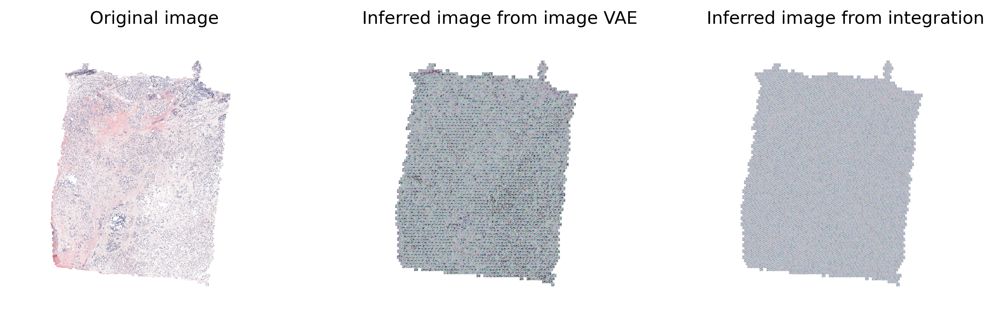

In [30]:
fig,axs=plt.subplots(1,3,figsize=(12,5),dpi=300)

image_slide_z = 0
vmax = 0.8
vmin = 0

ax=axs[0]
ax.imshow((wholeimg_stitch[:,:,:]*255).astype(np.uint8))
ax.axis('off')
ax.set_title('Original image')

ax=axs[1]
ax.imshow((recon_wholeimg_stitch[:,:,:]*255).astype(np.uint8))
ax.axis('off')
ax.set_title('Inferred image from image VAE')

ax=axs[2]
ax.imshow((recon_poe_wholeimg_stitch[:,:,:]*255).astype(np.uint8))
ax.axis('off')
ax.set_title('Inferred image from integration')

In [31]:
adata_df_concat = adata_sample.to_df()

Text(0.5, 1.0, 'Inferred exp (decoder3_POE) COL1A1')

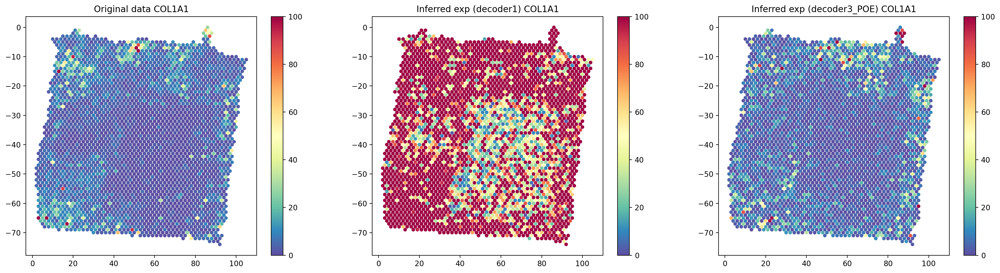

In [32]:
plotted_gene='COL1A1'

c_max = 100
c_min = 0

image_slide_z =11

fig,axs=plt.subplots(1,3,figsize=(24,6),dpi=200)

ax=axs[0]

all_spot = np.array(adata_df_concat)
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])

g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=15,c=all_spot[:,np.where(adata_df_concat.columns==plotted_gene)[0][0]],cmap='Spectral_r',vmax=c_max,vmin=c_min)
plt.colorbar(g, ax=ax)
ax.set_title('Original data '+plotted_gene)


ax=axs[1]
all_spot = recon_exp_stack
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])
g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=15,c=all_spot[:,np.where(adata_df_concat.columns==plotted_gene)[0][0]],cmap='Spectral_r',vmax=c_max,vmin=c_min)
plt.colorbar(g, ax=ax)
ax.set_title('Inferred exp (decoder1) '+plotted_gene)

ax=axs[2]
all_spot = recon_poe_rna_stack
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])
g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=15,c=all_spot[:,np.where(adata_df_concat.columns==plotted_gene)[0][0]],cmap='Spectral_r',vmax=c_max,vmin=c_min)
plt.colorbar(g, ax=ax)
ax.set_title('Inferred exp (decoder3_POE) '+plotted_gene)

In [33]:
adata_var = torch.Tensor(np.array(adata_df_concat)).to(device)
library = torch.Tensor(library_i).to(device)

adata_img_sk = torch.Tensor(trainset.spot_img_stack)
adata_img_sk = adata_img_sk.reshape(adata_img_sk.shape[0],-1).float().to(device) 
   

inference_outputs =  model.inference(adata_var)
#generative_outputs = model.generative(inference_outputs, adata_var, adata_img_sk,library)

adata_img_sk = adata_img_sk/255
# image, 2D data
img_path_outputs = model.predict_imgVAE(adata_img_sk)

generative_outputs = model.generative(inference_outputs, adata_var, torch.Tensor(np.array(sig_mean_zscore)).to(device),library,img_path_outputs)


# POE               
poe_path_outputs = model.predictor_POE(inference_outputs,
                                        generative_outputs, 
                                       img_path_outputs
                                    )

/var/folders/jd/g1r6gr1s3qnf8zpmc0p7pk3r0000gn/T/ipykernel_18361/3664224756.py:4: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  adata_img_sk = torch.Tensor(trainset.spot_img_stack)
/usr/local/lib/python3.9/site-packages/torch/nn/modules/container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


In [34]:
qc_p = inference_outputs['qc_m'].detach().cpu().numpy()
qz = inference_outputs['qz'].detach().cpu().numpy()
qz_m_ct = inference_outputs['qz_m_ct'].detach().cpu().numpy()
qn_m = inference_outputs['ql_m'].detach().cpu().numpy()
qn = inference_outputs['ql'].detach().cpu().numpy()
qc_p = torch.Tensor(qc_p)
qc_p_df = pd.DataFrame(qc_p,index = sig_mean_zscore.index)
px_rate = generative_outputs['px_rate'].detach().cpu().numpy()
px_r = generative_outputs['px_r'].detach().cpu().numpy()
px = NegBinom(generative_outputs['px_rate'], torch.exp(generative_outputs['px_r'])).sample()

img_z_mu = img_path_outputs['img_z_mu'].detach().cpu().numpy()
img_z_logv = img_path_outputs['img_z_logv'].detach().cpu().numpy()
img_qc = img_path_outputs['img_qc'].detach().cpu().numpy()

poe_img = poe_path_outputs['reconstruction_img'].detach().cpu().numpy()
mu_poe = poe_path_outputs['mu_poe'].detach().cpu().numpy()
var_poe = poe_path_outputs['var_poe'].detach().cpu().numpy()
px_rate_poe = poe_path_outputs['px_rate_poe'].detach().cpu().numpy()
px_r_poe = poe_path_outputs['px_r_poe'].detach().cpu().numpy()
px_poe = NegBinom(poe_path_outputs['px_rate_poe'], torch.exp(poe_path_outputs['px_r_poe'])).sample()

/usr/local/lib/python3.9/site-packages/torch/distributions/distribution.py:44: UserWarning: <class '__main__.NegBinom'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  warnings.warn(f'{self.__class__} does not define `arg_constraints`. ' +


In [35]:
import umap
fit = umap.UMAP(
        n_neighbors=45,
        min_dist=0.5,
        #n_components=2,
        
               )
%time u = fit.fit_transform(qz_m_ct.reshape([map_info.shape[0],-1]))


CPU times: user 38.9 s, sys: 574 ms, total: 39.5 s
Wall time: 10.4 s


(-1.2995493292808533,
 11.595806586742402,
 4.523036670684815,
 14.533230113983155)

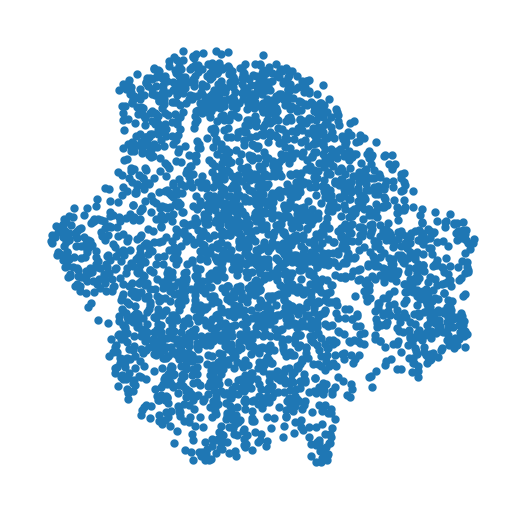

In [36]:
plt.figure(dpi=300,figsize=(2,2))
cmaps = ['Blues','Greens','Reds','Oranges','Purples']
plt.scatter(u[:,0],u[:,1],s=1)
#plt.legend(gene_sig.columns,loc='right', bbox_to_anchor=(2.2,0.5),)
#plt.colorbar(label='cell number')
#plt.title('UMAP of z')
plt.axis('off')
#plt.savefig('demo.pdf', transparent=True)

(-1.2995493292808533,
 11.595806586742402,
 4.523036670684815,
 14.533230113983155)

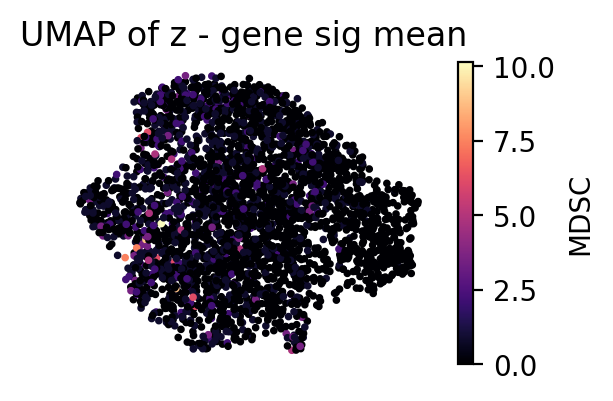

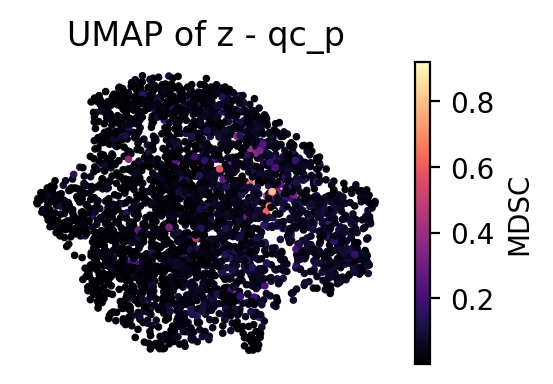

In [37]:
idx=10
plt.figure(dpi=200,figsize=(3,2))
plt.scatter(u[:,0],u[:,1],s=3,c=sig_mean_zscore.iloc[:,idx],cmap='magma')
plt.colorbar(label=gene_sig.columns[idx])
plt.title('UMAP of z - gene sig mean ')
plt.axis('off')

plt.figure(dpi=200,figsize=(3,2))
plt.scatter(u[:,0],u[:,1],s=3,c=qc_p[:,idx],cmap='magma')
plt.colorbar(label=gene_sig.columns[idx])
plt.title('UMAP of z - qc_p')
plt.axis('off')

In [38]:
np.exp(qn_m).shape,library.shape

((3099, 1), torch.Size([27, 1]))

Text(0, 0.5, 'library')

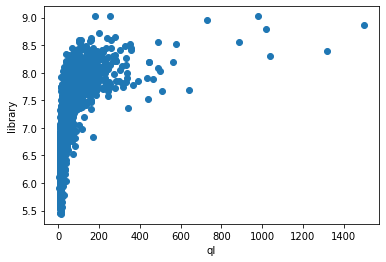

In [39]:
plt.scatter(np.exp(qn_m),win_loglib)
plt.xlabel('ql')
plt.ylabel('library')

In [40]:
def pl_spatial_gsva(adata_sample,
               map_info,
               color_mtx,
               idx,
               s,
                    cmap,
               plt_title,
               vmin=None,
               vmax=None,
               
              ):
    
    color_idx_list = (color_mtx.iloc[:,idx].astype(float))
    all_loc = np.array(map_info.loc[:,['array_col','array_row']])
    fig,axs= plt.subplots(1,1,figsize=(3,2.5),dpi=300)
    g=axs.scatter(all_loc[:,0],-all_loc[:,1],cmap=cmap,alpha=1,linewidths=0,marker='h',
                  c=color_idx_list,s=s,vmin=vmin,vmax=vmax)
    #axs.scatter(all_loc[color_mtx.iloc[:,idx].astype(float)<0.01,0],-all_loc[color_mtx.iloc[:,idx].astype(float)<0.01,1],c='lightgray',s=s,vmin=vmin,vmax=vmax)

    #plt.legend(color_unique_idx,title='disc_gsva',loc='right',bbox_to_anchor=(1.3, 0.5))
    fig.colorbar(g)
    plt.title(plt_title)
    axs.set_xticks([])
    axs.set_yticks([])
    plt.axis('off')
    
    pass
def pl_spatial_latent(adata_sample,
               map_info,
               color_mtx,
               idx,
               plt_title,
               vmin=None,
               vmax=None,
               s=3,
               cm = 'gist_ncar'
              ):
    
    color_idx_list = list(color_mtx.iloc[:,idx].astype(float))
    all_loc = np.array(map_info.loc[:,['array_col','array_row']])
    fig,axs= plt.subplots(1,1,figsize=(3,3),dpi=300)
    g=axs.scatter(all_loc[:,0],-all_loc[:,1],cmap=cm,c=color_idx_list,s=s,vmin=vmin,vmax=vmax)

    #plt.legend(color_unique_idx,title='disc_gsva',loc='right',bbox_to_anchor=(1.3, 0.5))
    fig.colorbar(g)
    plt.title(plt_title)
    axs.set_xticks([])
    axs.set_yticks([])
    axs.axis('off')
    
    pass

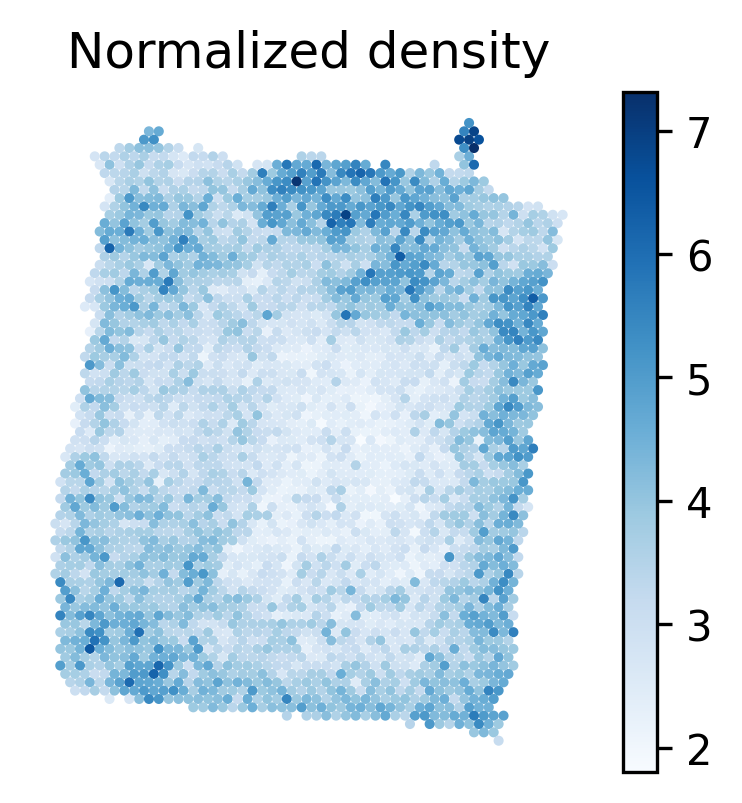

In [41]:
idx=0
qn_df = pd.DataFrame(qn_m)
pl_spatial_latent(adata_sample,
                  map_info,
                  qn_df,
                  #(qn_df - qn_df.min())/(qn_df.max() - qn_df.min()),
                  #qn_df/qn_df.max(),
                  idx,
                  s=2,
                  plt_title='Normalized density',
                  cm='Blues',
                  #
                  #vmax=0.5
                 )

In [176]:
qc_p.mean()

tensor(0.0385)

In [178]:
qc_p = pd.DataFrame(torch.Tensor(qc_p),index = sig_mean_zscore.index)


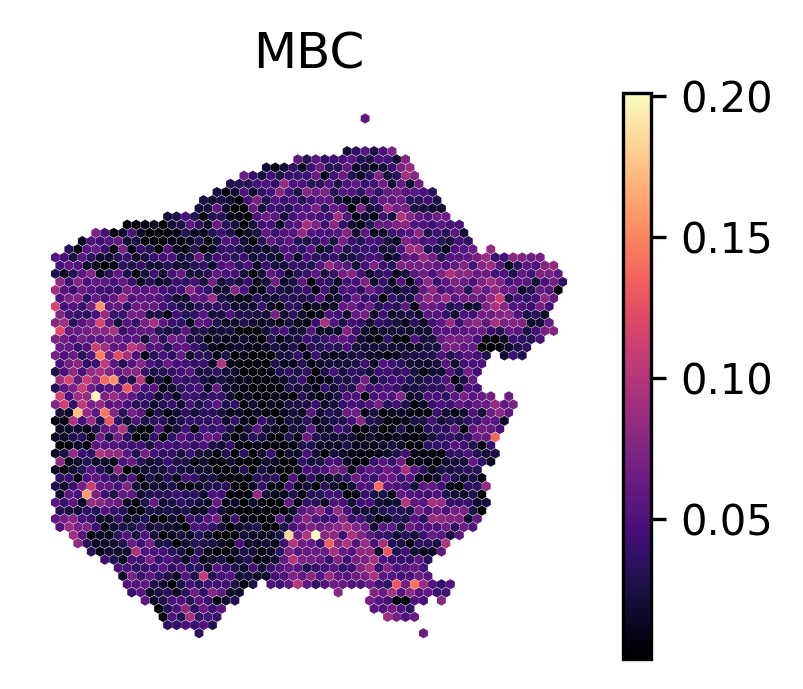

In [185]:
idx=11

#qc_p = qc_p/qc_p.sum(axis=1,keepdims=True) 
#qc_p_df = pd.DataFrame(torch.Tensor(qc_p*np.exp(qn)),index = sig_mean_zscore.index)

pl_spatial_gsva(adata_sample,
                           map_info,
                           qc_p,
                            idx,
                           s=6,
                           #vmin=0.05,
                            #vmax=0.1,
                           #vmax=qc_p.max(axis=0).mean(),#qc_p[:,idx].max(),
                            cmap='magma',
                           plt_title=gene_sig.columns[idx]
                          )

InvalidIndexError: (slice(None, None, None), 1)

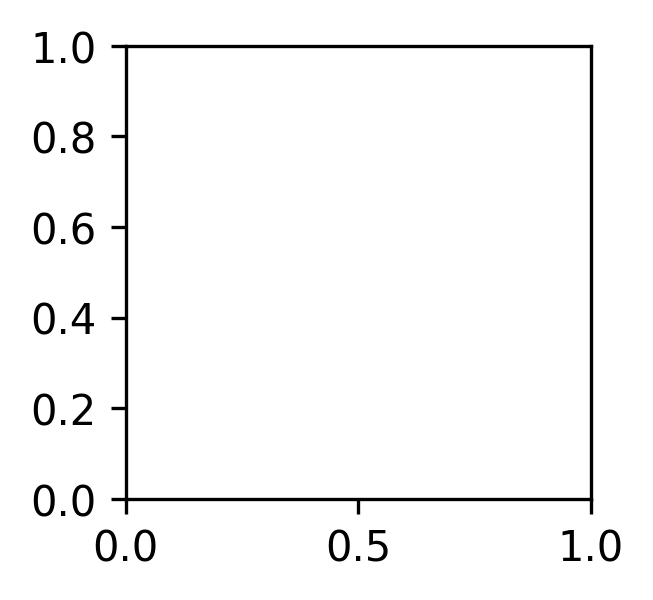

In [189]:
idx = 1
figs,ax=plt.subplots(1,1,dpi=300,figsize=(2,2))
ax.scatter(sig_mean.iloc[:,idx],qc_p[:,idx],s=1)
ax.set_aspect('equal')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.axis('equal')
# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
#plt.title(proportions.columns[idx])
#plt.xlim([-0.1,1.1])
#plt.ylim([-0.1,0.5])
#plt.xticks(np.arange(0,1.1,0.5))
#plt.yticks(np.arange(0,1.1,0.5))
plt.xlabel('Ground truth proportions')
plt.ylabel('Predicted proportions')

In [190]:
lib_low=torch.exp(torch.Tensor([5.0])).to(device)
inference_outputs, generative_outputs, px = starfysh.model_eval(model,adata_sample, sig_mean, device,log_lib,lib_low)
u = post_analysis.get_z_umap(inference_outputs)
u = pd.DataFrame(u,columns=['umap1','umap2'])
u.index = map_info.index

/Users/siyuhe/03_Spatial_project/starfysh_img/starfysh.py:472: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  library_i = torch.Tensor(library_i[:,None])
/usr/local/lib/python3.9/site-packages/torch/nn/modules/container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


TypeError: generative() missing 1 required positional argument: 'img_path_outputs'

#### 1. gene sig mean vs. inferred prop

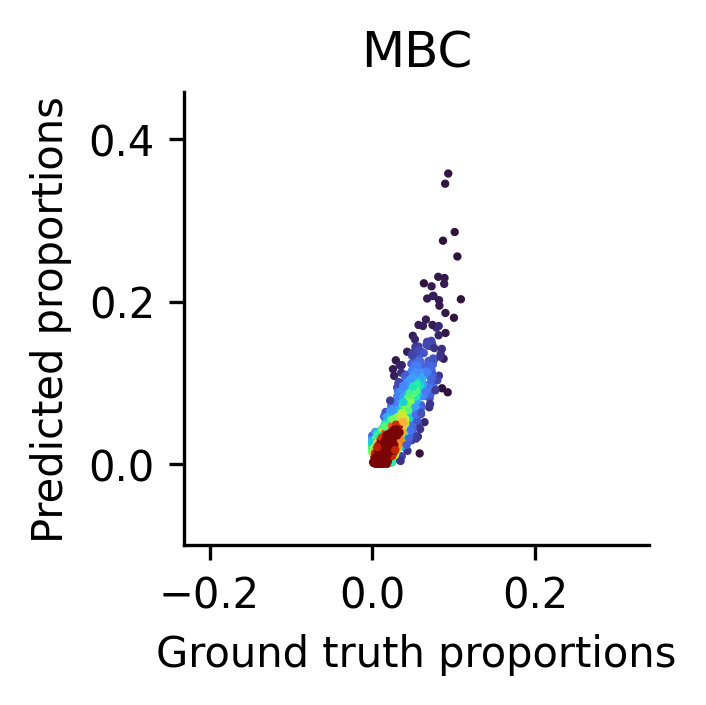

In [27]:
sig_mean_n_df = pd.DataFrame(np.array(sig_mean)/(np.sum(np.array(sig_mean),axis=1,keepdims=True)+1e-5),
                                 columns=sig_mean.columns,
                                 index = sig_mean.index
                                )
post_analysis.pred_prop_scatter(inference_outputs,
                                    sig_mean_n_df,
                                    idx=11)

In [18]:
if data_folder =='simu_data':
    post_analysis.plot_type_all(inference_outputs,np.array(u),proportions)

In [19]:
if data_folder =='simu_data':
    post_analysis.get_corr_map(inference_outputs,sig_mean,proportions)

#### 2. inferred density

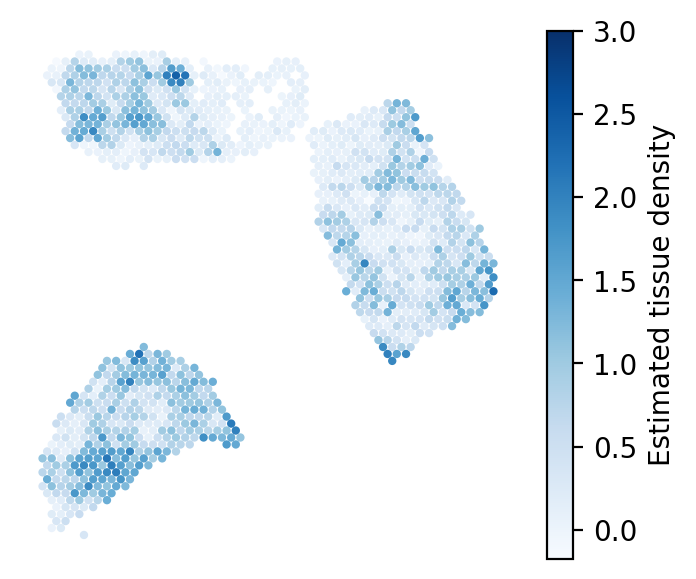

In [20]:
plot_utils.pl_spatial_inf_feature(adata_sample,
                   map_info,
                   inference_outputs,
                   feature='ql_m',
                   idx=0,
                   plt_title='',
                   label='Estimated tissue density',
                   s=4,
                   vmax=3
                   )

#### 3. inferred prop. on umap (adjust idx number for different cell types)

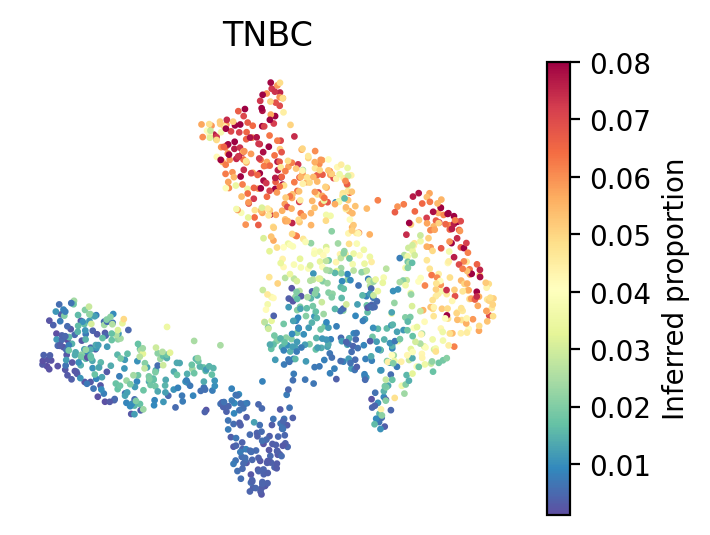

In [21]:
idx=12



plot_utils.pl_umap_feature(adata_sample,
                   u,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),#/np.sum(np.array(sig_mean),axis=1,keepdims=True),
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred proportion',
                   s=2,
                   vmax=0.08
                   )

#### 4. inferred prop. on spatial loc (adjust idx number for different cell types)

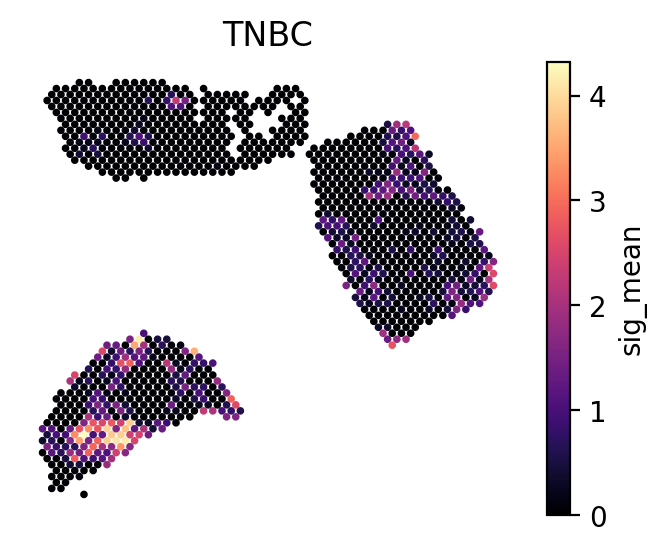

In [22]:
from scipy import stats
idx=12


plot_utils.pl_spatial_feature(adata_sample,
                   map_info,
                   feature=np.array(sig_mean_zscore),
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='sig_mean',
                   s=3,
                   #vmax=3
                   )


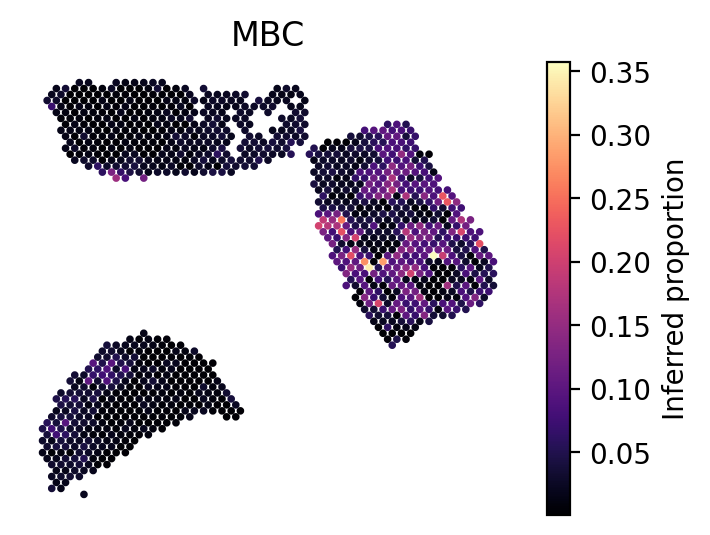

In [26]:
idx=11


plot_utils.pl_spatial_feature(adata_sample,
                   map_info,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred proportion',
                   s=3,
                   #vmax=0.08
                   )

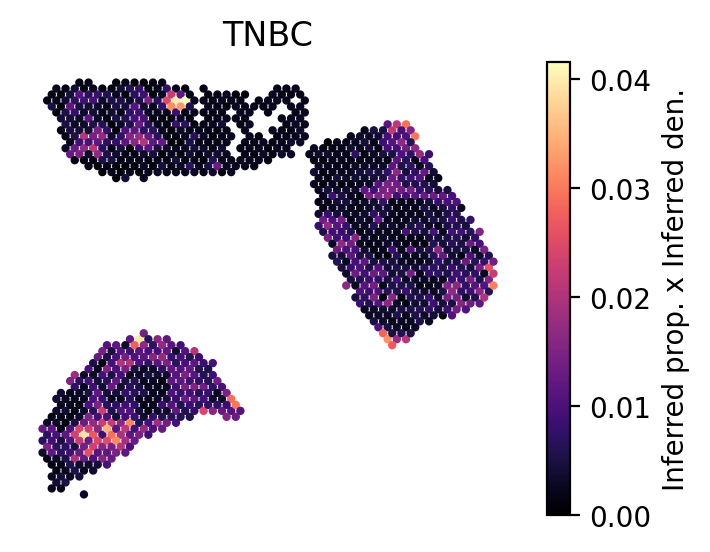

In [24]:
idx=12
ql_m_norm = np.exp(inference_outputs['ql_m'].detach().cpu().numpy())
ql_m_norm = (ql_m_norm-ql_m_norm.min())/(ql_m_norm.max()-ql_m_norm.min())
                   
plot_utils.pl_spatial_feature(adata_sample,
                   map_info,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy())*ql_m_norm,
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred prop. x Inferred den.',
                   s=4,
                   #vmax=0.005
                   )

In [28]:
model.alpha

Parameter containing:
tensor([495.5222, 767.3705,  87.4324, 131.0010, 306.8056, 633.5967, 489.1432,
        895.7648, 454.9588, 631.9329, 347.7653, 400.8643,  22.1469, 168.0002,
        293.0026, 517.6083, 696.7100, 798.9351, 160.3449, 281.7472, 680.9212,
        914.3892, 396.7209, 873.2192, 418.8300, 552.3292], requires_grad=True)

In [26]:
dist = {
        'px_rate': generative_outputs['px_rate'].detach().cpu().numpy().tolist(),
        'px_r': generative_outputs['px_r'].detach().cpu().numpy().tolist(),
        'pc_p': generative_outputs['pc_p'].detach().cpu().numpy().tolist(),

        'qc_m': inference_outputs['qc_m'].detach().cpu().numpy().tolist(),
        'qc': inference_outputs['qc'].detach().cpu().numpy().tolist(),
        'qz_m': inference_outputs['qz_m'].detach().cpu().numpy().tolist(),
        'qz_m_ct': inference_outputs['qz_m_ct'].detach().cpu().numpy().tolist(),
        'qz_logv': inference_outputs['qz_logv'].detach().cpu().numpy().tolist(),
        'qz_logv_ct': inference_outputs['qz_logv_ct'].detach().cpu().numpy().tolist(),
        'qz': inference_outputs['qz'].detach().cpu().numpy().tolist(),
        'ql_m': inference_outputs['ql_m'].detach().cpu().numpy().tolist(),
        'ql_logv': inference_outputs['ql_logv'].detach().cpu().numpy().tolist(),
        'ql': inference_outputs['ql'].detach().cpu().numpy().tolist(),
}


import json
#with open('/content/drive/MyDrive/SpatialModelProject/model_test_colab/results/02_factor/'+sample_id+'_factor.json', 'w') as fp:
with open('results/02_factor/'+sample_id+'_factor.json', 'w') as fp:

    json.dump(dist, fp)